In [2]:
import sys
sys.path.append('../')

import numpy as np
import pandas as pd
import seaborn as sns
import re
import matplotlib.pyplot as plt
import warnings

from config.config import CSV_PATH, MODEL_PARAMS, MODEL_PATH, CROP_MAPPING
from utils.data_visualization import  plot_crop_type_count



# Geospatial related imports


%matplotlib inline

In [4]:
dataset = pd.read_csv(CSV_PATH)
df1 = dataset.copy()
# df = df1.groupby('Field_Id').mean().reset_index()
df1

,Pixel_Id,Field_Id,Crop_Id_Ne,Crop_Type,Band_01_20170101,Band_02_20170101,Band_03_20170101,Band_04_20170101,Band_05_20170101,Band_06_20170101,...,Band_05_20170804,Band_06_20170804,Band_07_20170804,Band_08_20170804,Band_8A_20170804,Band_09_20170804,Band_10_20170804,Band_11_20170804,Band_12_20170804,NDVI_20170804
0,14,19,8,Vineyard,1159,1025,1083,999,1373,2647,...,1604,1929,2206,2328,2544,923,20,3062,2125,0.221086
1,15,19,8,Vineyard,1160,978,1041,882,1357,2688,...,1585,1933,2210,2250,2567,923,20,3049,2092,0.244469
2,16,19,8,Vineyard,1162,957,1045,900,1319,2768,...,1537,1929,2191,2270,2559,921,20,2981,2002,0.260061
3,17,19,8,Vineyard,1163,974,1018,911,1298,2786,...,1516,1929,2186,2315,2549,918,19,2938,1950,0.277241
4,18,19,8,Vineyard,1165,973,1015,896,1295,2747,...,1527,1934,2195,2316,2536,915,19,2913,1933,0.287740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452617,960141,3602,6,Pecan,1219,1133,1136,1308,1411,2069,...,1539,1746,1974,1893,2211,893,15,2590,1801,0.176873
452618,960142,3602,6,Pecan,1222,1161,1173,1356,1422,2122,...,1501,1685,1892,1696,2110,893,14,2522,1785,0.141319
452619,960143,3602,6,Pecan,1227,1146,1142,1232,1388,2293,...,1518,1754,1954,1784,2206,894,14,2544,1767,0.162973
452620,960170,3602,6,Pecan,1207,1136,1136,1274,1378,2376,...,1689,1926,2191,2335,2473,930,14,2774,1788,0.186785


## Outliers

Box plot / column

Boxplot / classe

_____________________________________________________________________________


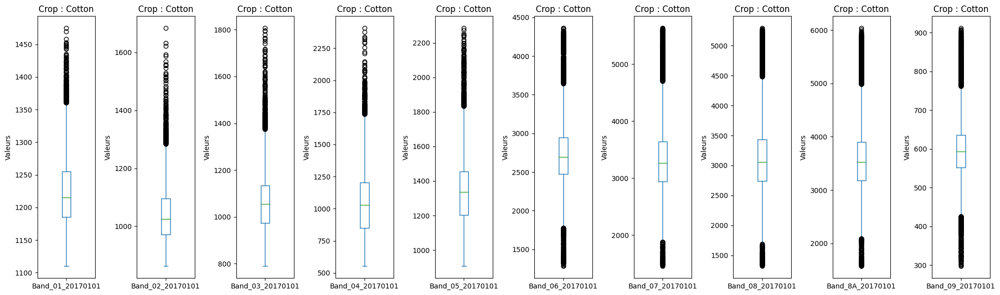

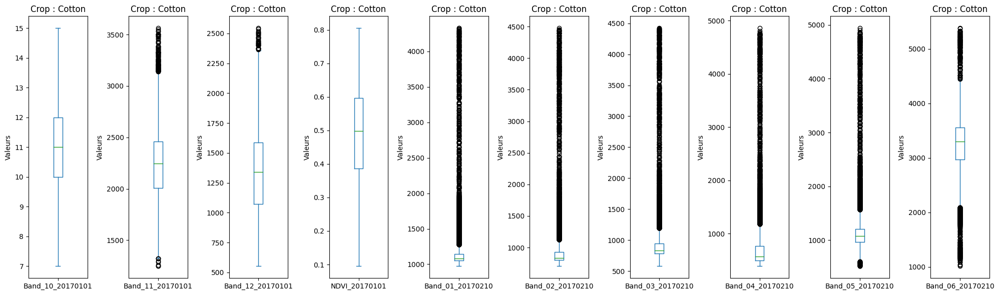

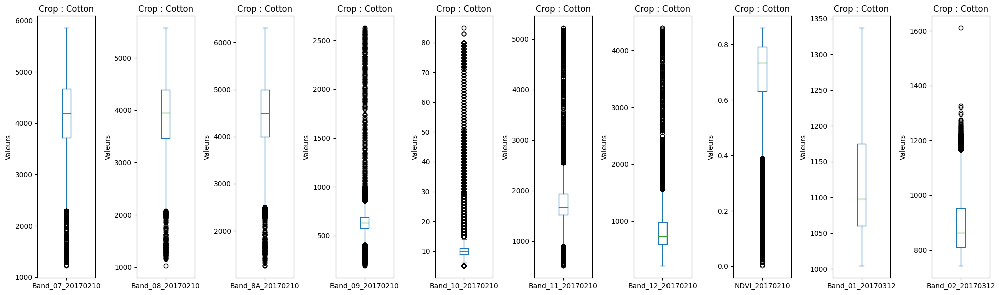

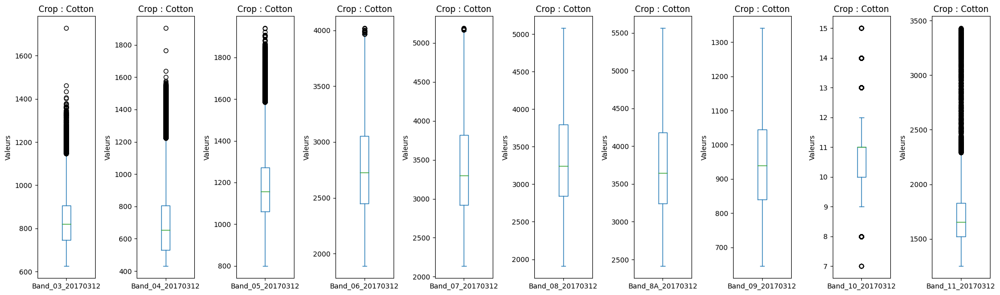

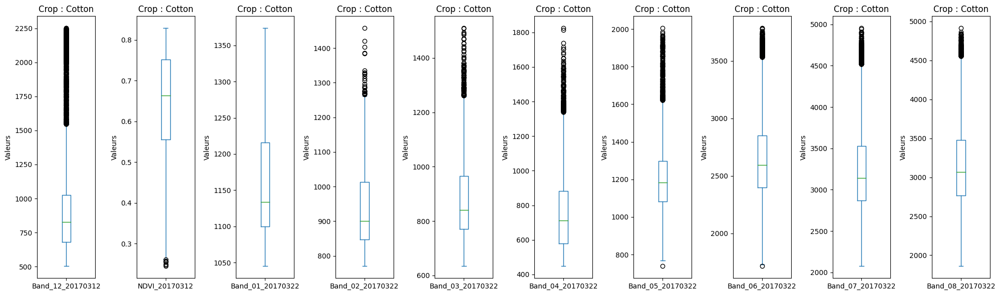

...

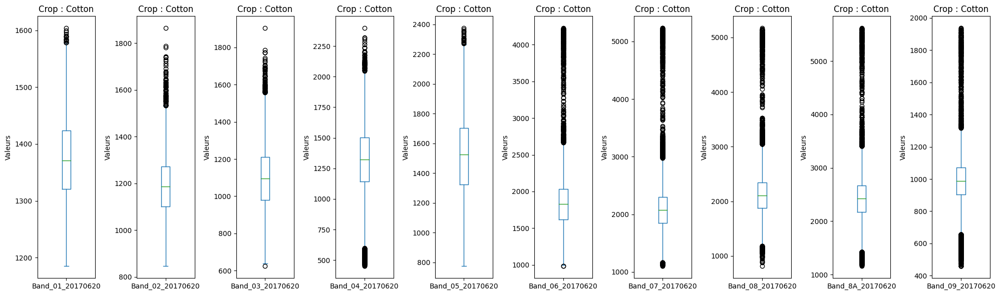

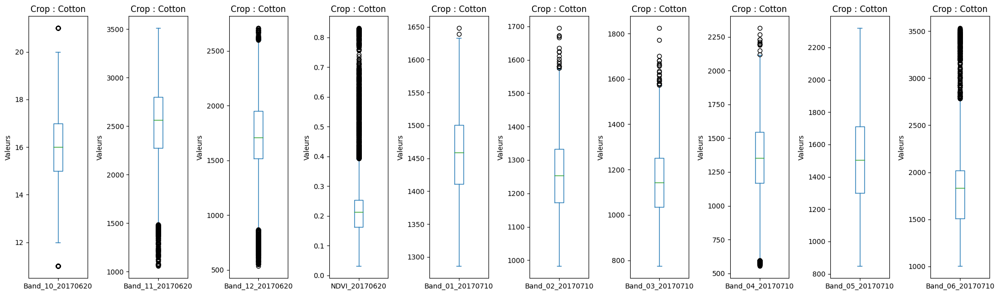

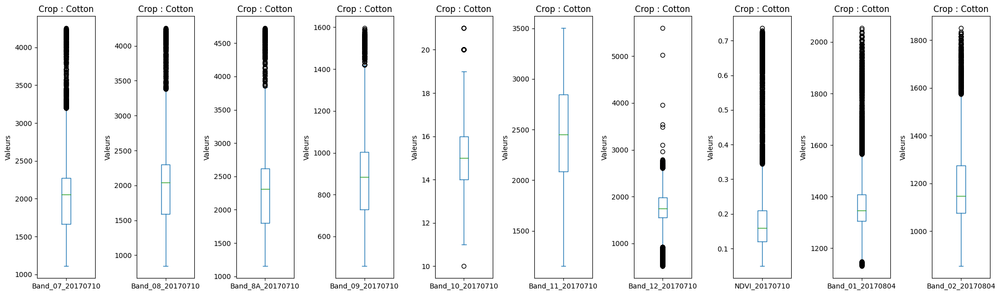

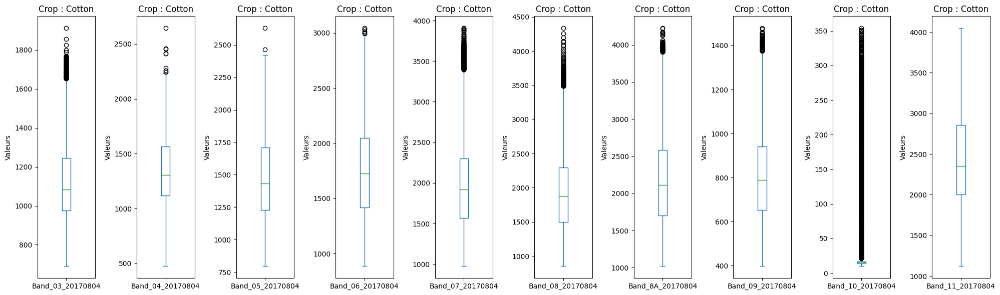

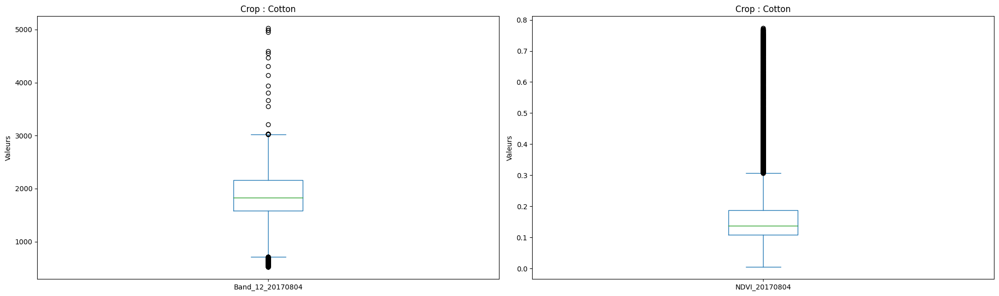

_____________________________________________________________________________


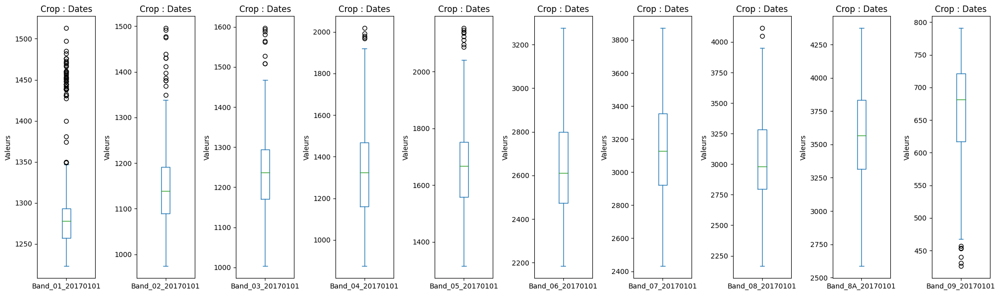

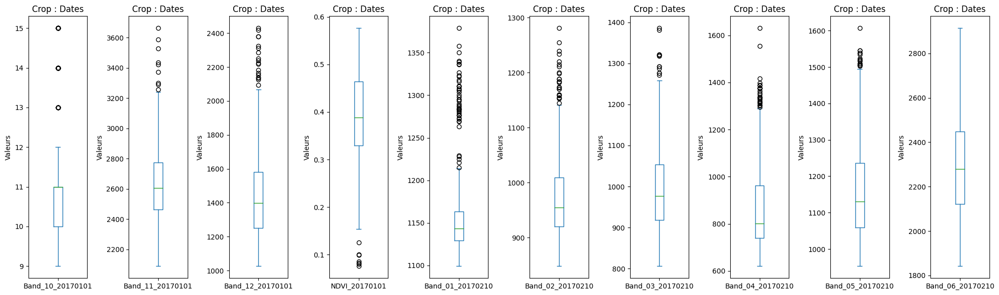

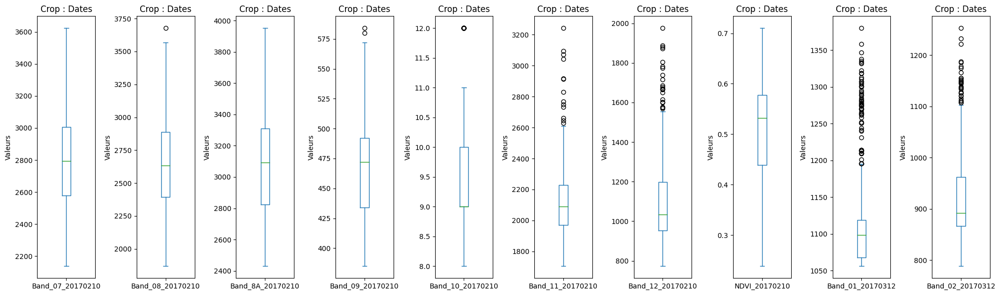

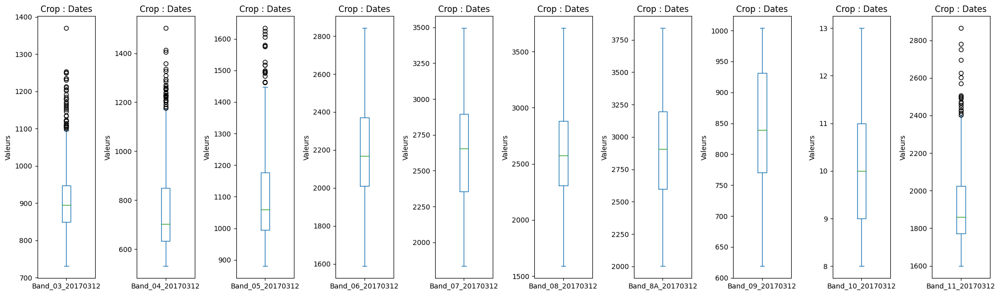

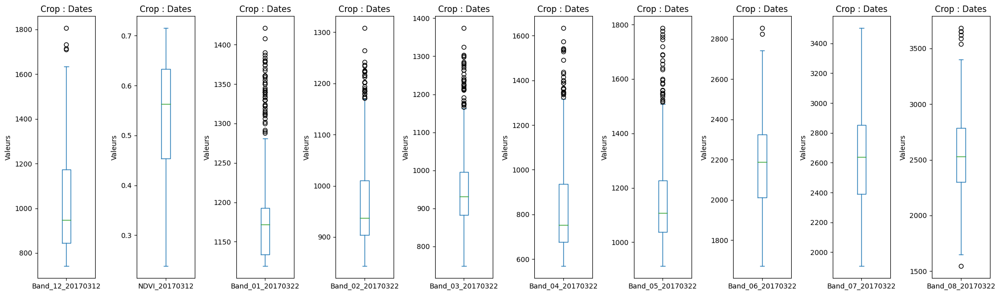

...

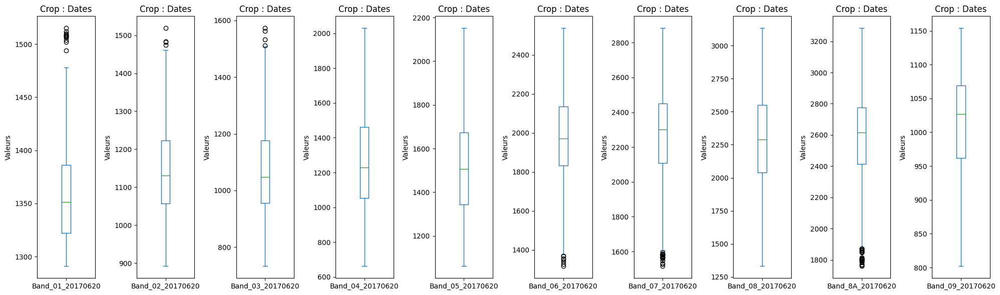

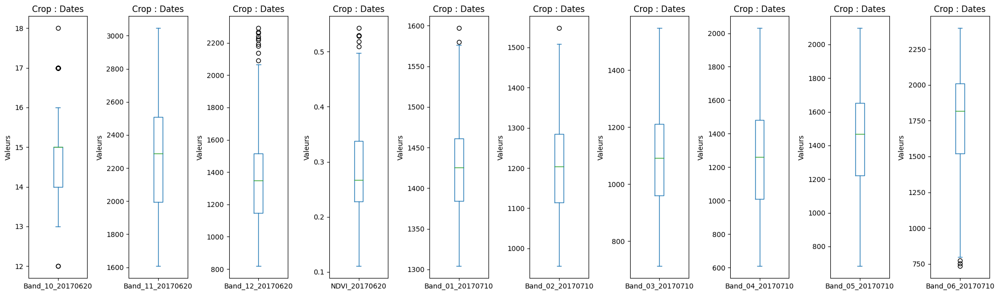

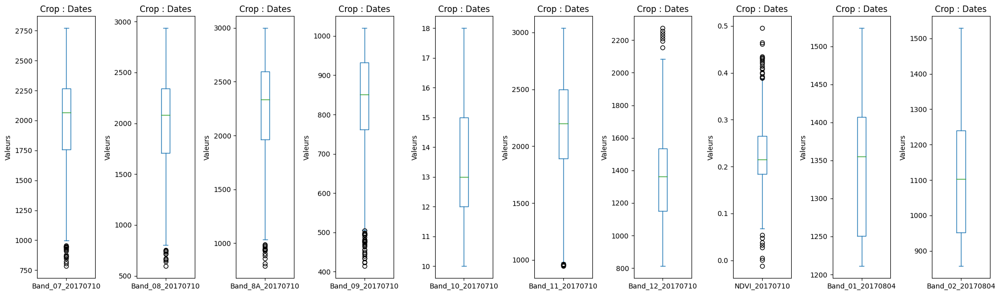

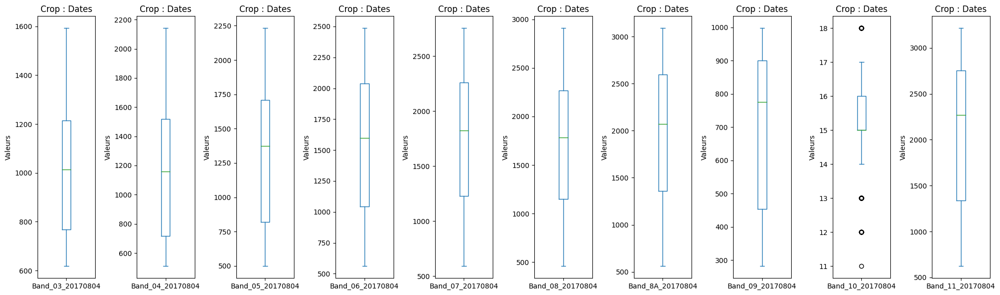

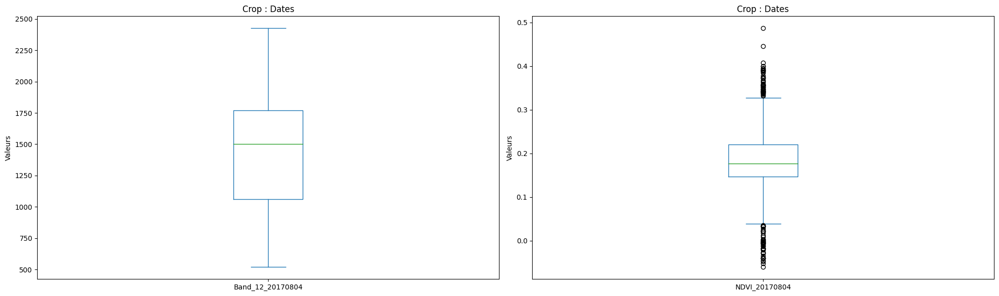

_____________________________________________________________________________


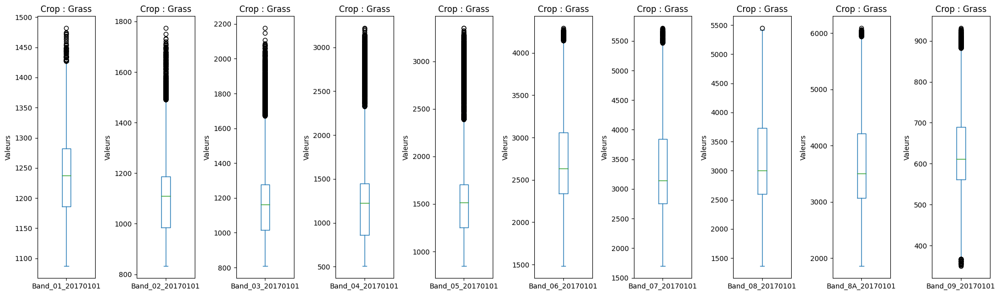

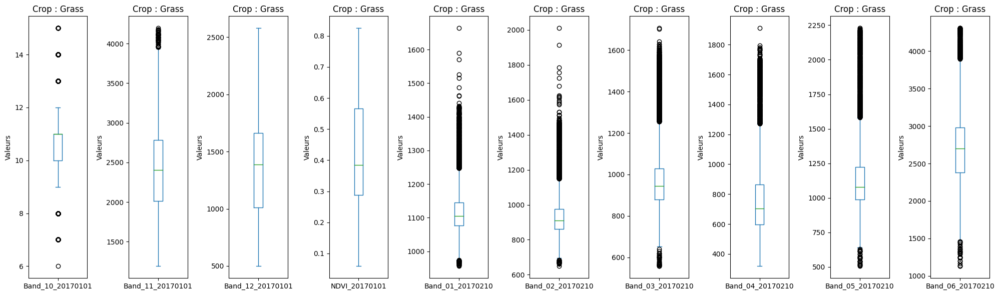

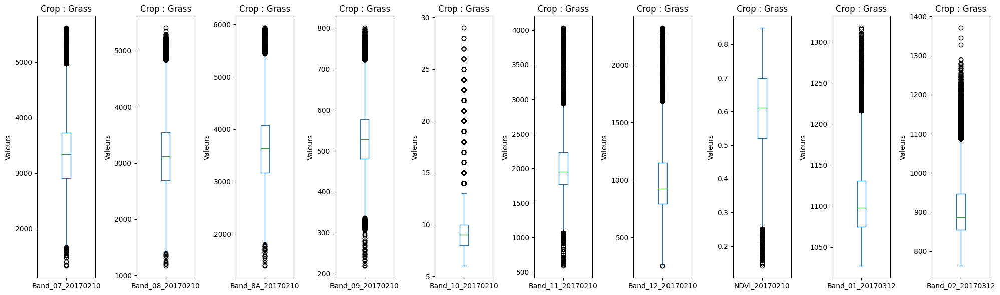

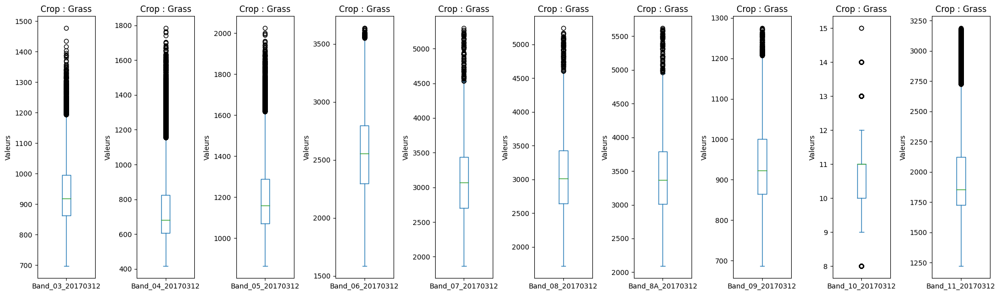

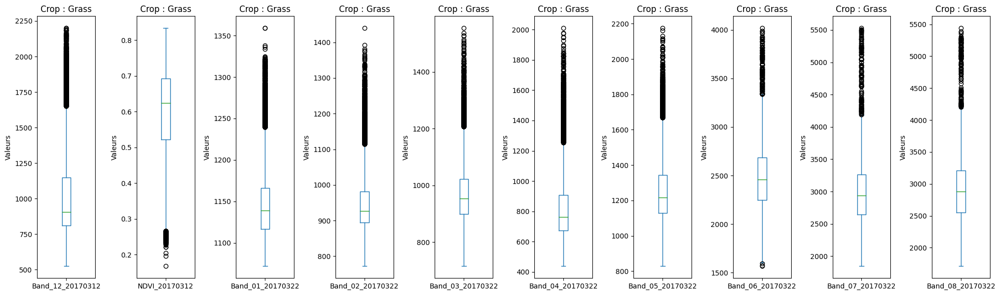

...

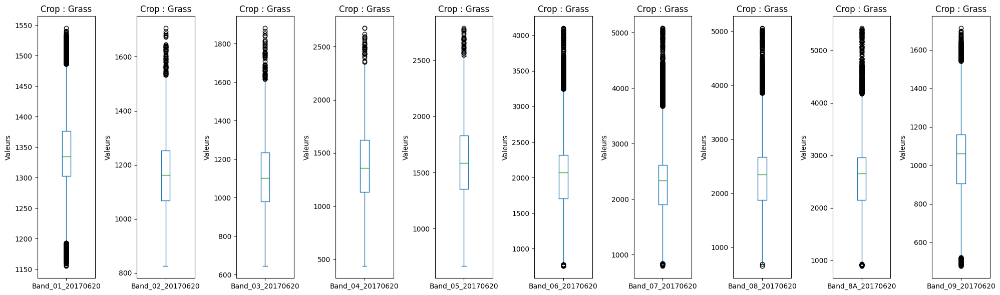

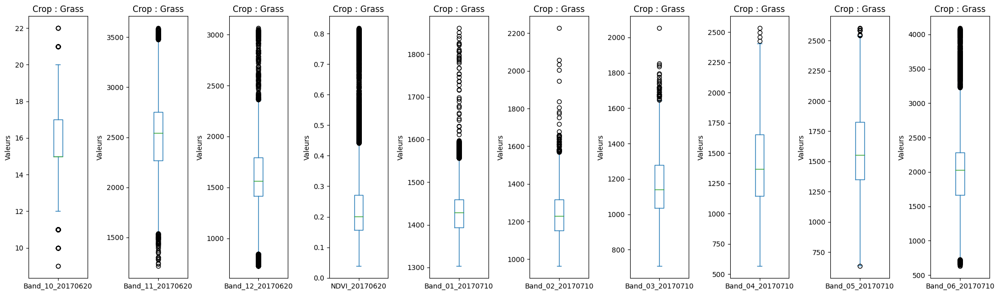

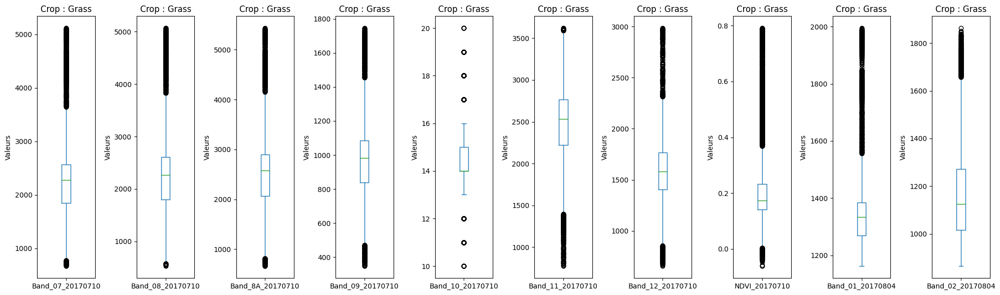

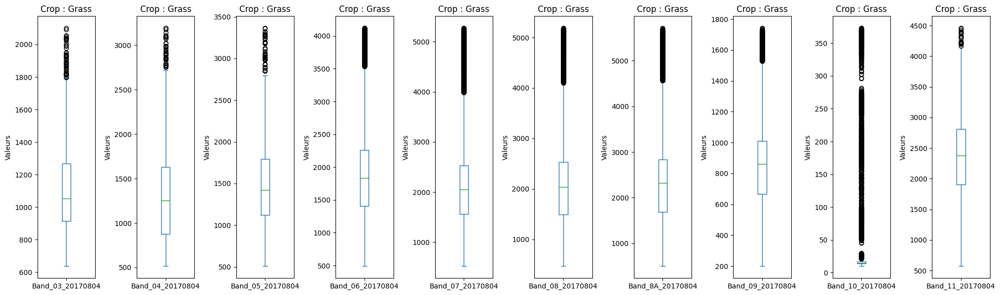

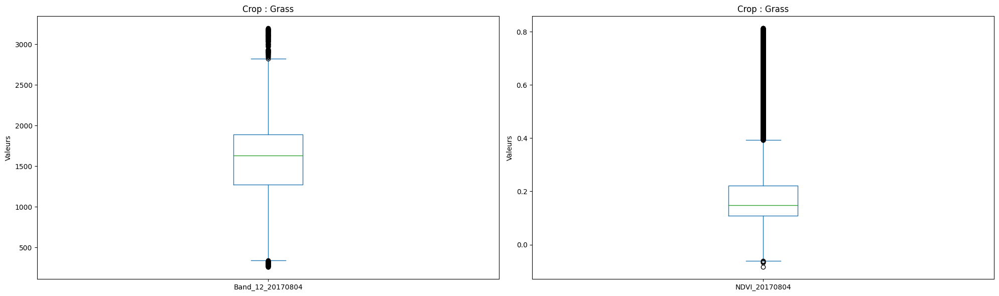

_____________________________________________________________________________


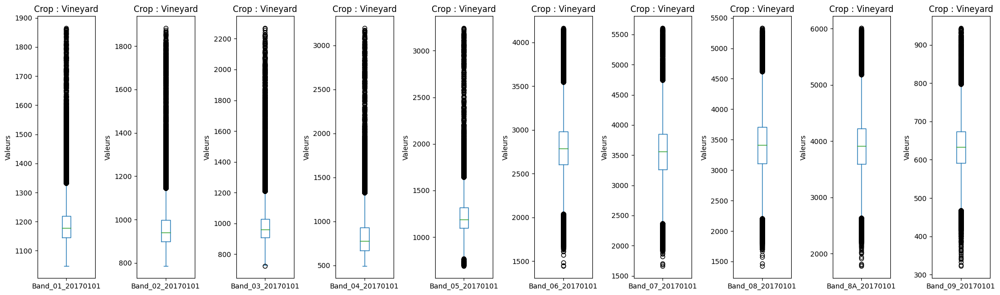

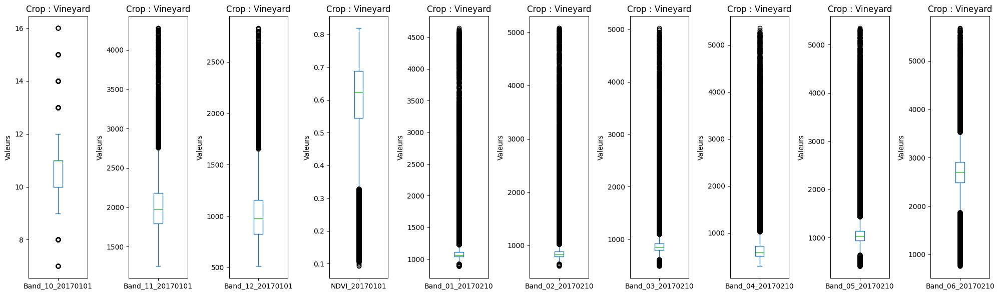

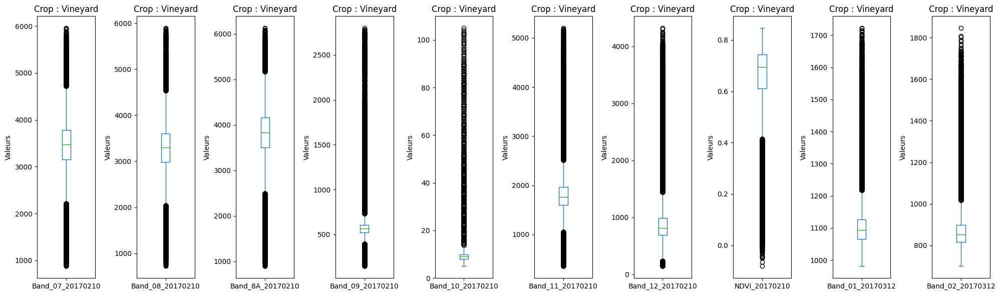

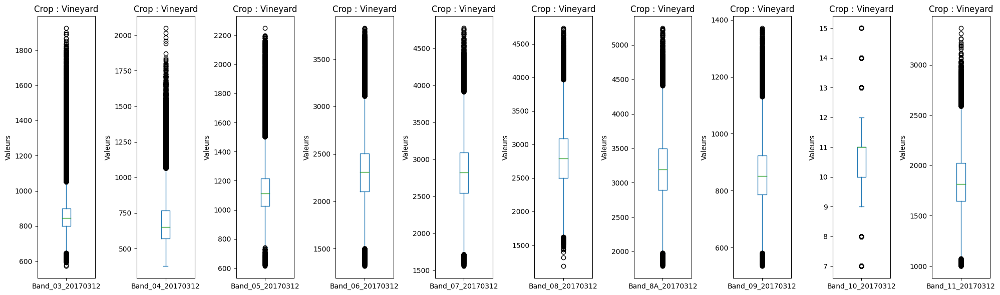

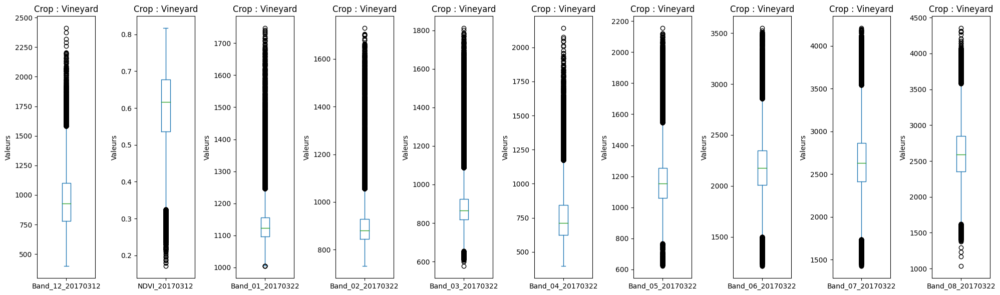

...

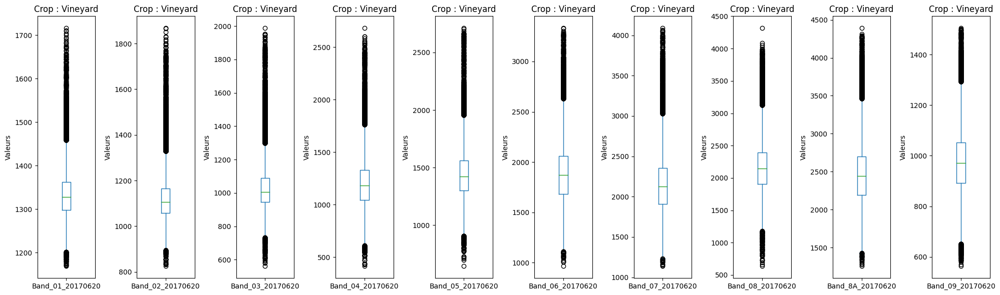

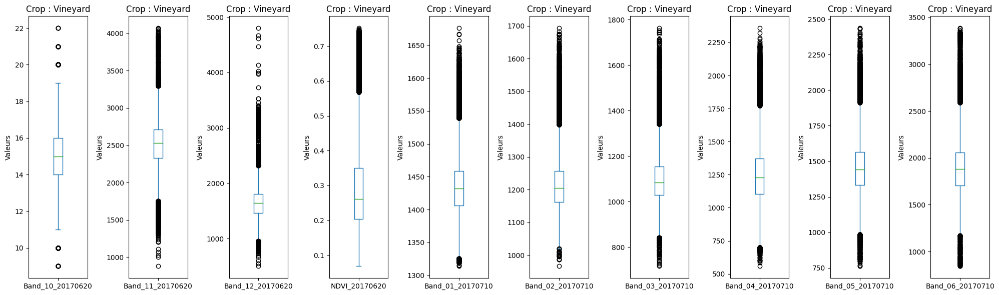

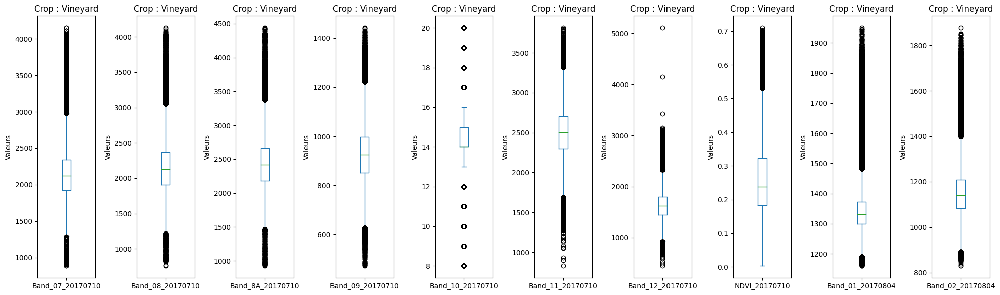

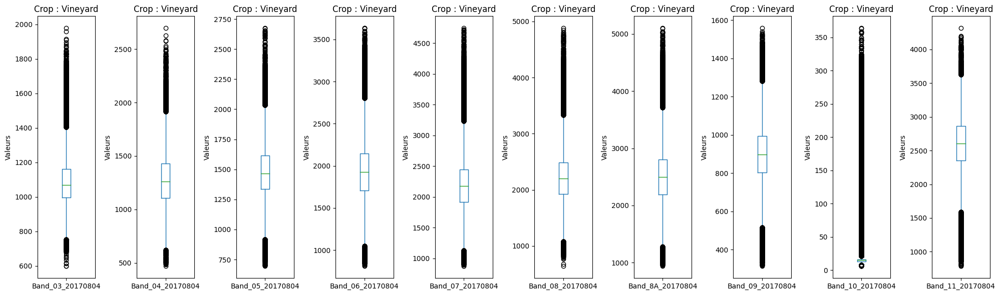

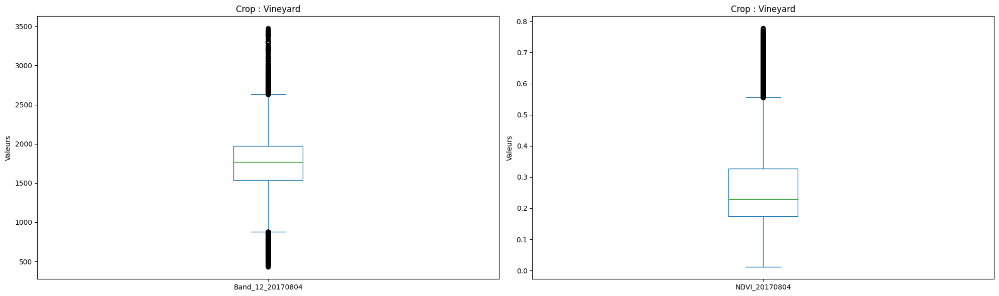

In [ ]:
crop_mapping = {
    1: 'Cotton',
    2: 'Dates',
    3: 'Grass',
    4: 'Lucern',
    5: 'Maize',
    6: 'Pecan',
    7: 'Vacant',
    8: 'Vineyard',
    9: 'Vineyard & Pecan ("Intercrop")'
}

#  four crop classes to visualise
croptoinclude = [1, 2, 3, 8]


df_subset = df1[df1['Crop_Id_Ne'].isin(croptoinclude)]

# Group the dataset by Crop_Id_Ne
grouped = df_subset.groupby('Crop_Id_Ne')

# Iteration over  groups
for crop_id, group_data in grouped:

    print('_____________________________________________________________________________')
    colonnes_a_exclure = ['Pixel_Id', 'Field_Id', 'Crop_Id_Ne','Crop_Type']
    colonnes_utiles = [col for col in group_data.columns if col not in colonnes_a_exclure]

    # Calculate the number of subplots needed
    nombre_lignes = (len(colonnes_utiles) + 9) // 10

    for i in range(nombre_lignes):
        debut = i * 10
        fin = min(debut + 10, len(colonnes_utiles))
        groupe_colonnes = colonnes_utiles[debut:fin]

        plt.figure(figsize=(20, 6))

        for j, colonne in enumerate(groupe_colonnes, 1):
            plt.subplot(1, len(groupe_colonnes), j)
            group_data[colonne].plot(kind='box')
            plt.ylabel('Valeurs')
            plt.title(f'Crop : {crop_mapping[crop_id]}')

        plt.tight_layout()
        plt.show()


In [ ]:
df1['Crop_Type'].value_counts()

Vineyard                          152022
Lucern                             96422
Maize                              57304
Vacant                             52873
Pecan                              39975
Cotton                             24631
Vineyard & Pecan ("Intercrop")     14631
Grass                              14136
Dates                                628
Name: Crop_Type, dtype: int64

distribution des classes / pixels

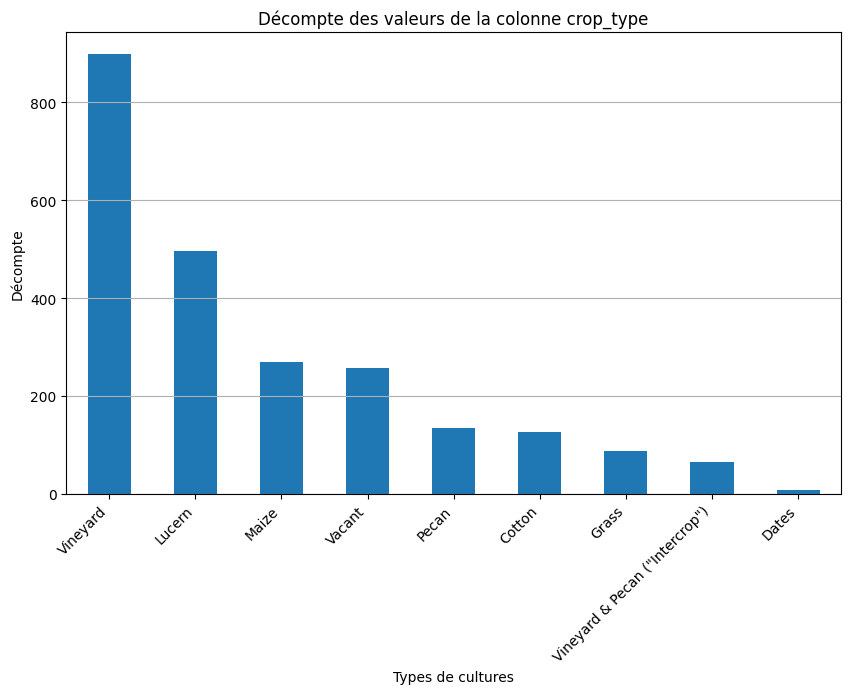

In [5]:
plot_crop_type_count(df1)

distribution des classes / parcelle

In [ ]:
er =df1.groupby('Field_Id').mean().reset_index()
er['Crop_Id_Ne'].value_counts()

<ipython-input-9-368e6b9e2726>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  er =df1.groupby('Field_Id').mean().reset_index()


8.0    899
4.0    497
5.0    269
7.0    257
6.0    135
1.0    126
3.0     87
9.0     66
2.0      7
Name: Crop_Id_Ne, dtype: int64

### Evaluation de NDVI

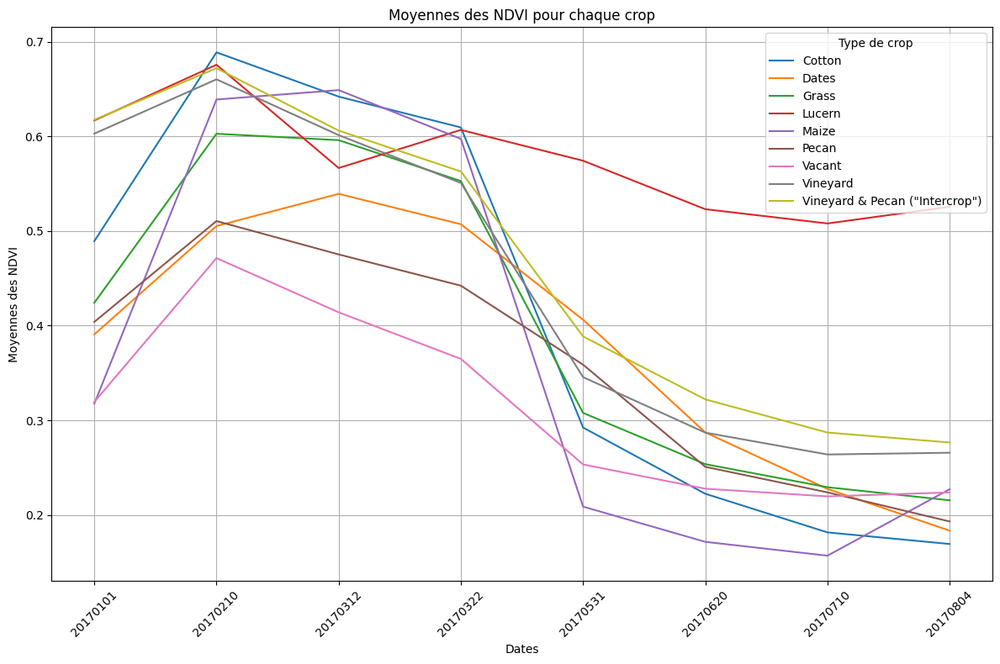

In [ ]:
# Créer une parcelle pour chaque type de culture
parcelles = {}
for i in range(1, 10):
    parcelles[i] = df1.loc[df1['Crop_Id_Ne'] == i]


# Calculer les moyennes des NDVI pour chaque type de culture et les regrouper par date
moyennes_ndvi_par_type = {}
for i, parcelle in parcelles.items():
    colonnes_ndvi = [col for col in parcelle.columns if 'NDVI' in col]
    dates = sorted(set([re.findall(r'\d{8}', col)[0] for col in colonnes_ndvi]))
    moyennes_ndvi = parcelle[colonnes_ndvi].mean()
    moyennes_ndvi_par_type[i] = pd.Series(moyennes_ndvi.values, index=dates)

# Tracer les moyennes des NDVI avec différentes couleurs pour chaque type de culture
plt.figure(figsize=(12, 8))
for i, moyennes_ndvi in moyennes_ndvi_par_type.items():
    plt.plot(moyennes_ndvi.index, moyennes_ndvi.values, label=crop_mapping[i])

plt.title('Moyennes des NDVI pour chaque crop')
plt.xlabel('Dates')
plt.ylabel('Moyennes des NDVI')
plt.xticks(rotation=45)
plt.legend(title='Type de crop')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
mean_df = df1.groupby('Field_Id').mean().reset_index()

newcol = ['Field_Id','NDVI_20170101','NDVI_20170210', 'NDVI_20170312' , 'NDVI_20170322' , 'NDVI_20170531' , 'NDVI_20170620' , 'NDVI_20170710' , 'NDVI_20170804']

newdf = mean_df[newcol]
# Extract month and year from column names
dates = [col.split('_')[1] for col in newdf.columns[1:]]
dates = sorted(dates, key=lambda x: (int(x[4:]), int(x[:4])))

# Reorganize the columns
new_cols = ['Field_Id'] + [f'NDVI_{date}' for date in dates]
newdf = newdf[new_cols]

<ipython-input-27-57f0ab2aa107>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_df = df1.groupby('Field_Id').mean().reset_index()


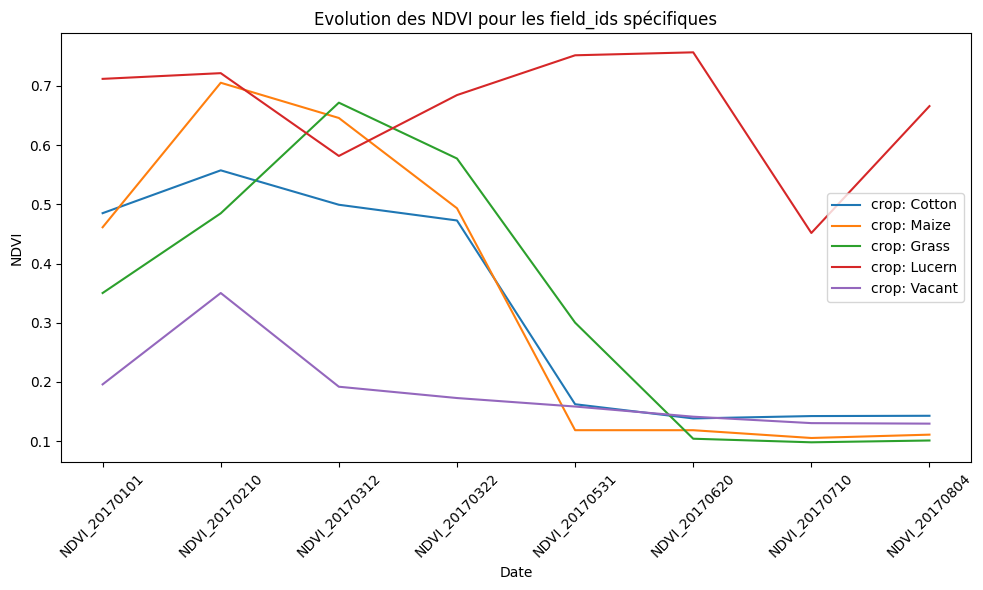

In [ ]:
field_ids = [19, 25, 26, 27,41]

mapping = {
    19 : 'Cotton',
    25 : 'Maize',
    26 : 'Grass',
    27 : 'Lucern',
    41 : 'Vacant'
}
selected_data = newdf[newdf['Field_Id'].isin(field_ids)]

# Transposer pour que les dates deviennent les index et les field_ids deviennent les colonnes
selected_data = selected_data.set_index('Field_Id').T


plt.figure(figsize=(10, 6))
for field_id in field_ids:
    plt.plot(selected_data.index, selected_data[field_id], label=f"crop: {mapping[field_id]}")

plt.title('Evolution des NDVI pour les field_ids spécifiques')
plt.xlabel('Date')
plt.ylabel('NDVI')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

De mois 1 à mois 4, les valeurs sont élevées,ce qui signifie que la végétation est dense en hiver.

De mois 5 à mois 8, la plupart des valeurs de NDVI diminuent,ce qui indique que les cultures ont été récoltées et que les champs sont devenus vides.

array([[<Axes: title={'center': 'Field_Id'}>,
        <Axes: title={'center': 'NDVI_20170101'}>,
        <Axes: title={'center': 'NDVI_20170210'}>],
       [<Axes: title={'center': 'NDVI_20170312'}>,
        <Axes: title={'center': 'NDVI_20170322'}>,
        <Axes: title={'center': 'NDVI_20170531'}>],
       [<Axes: title={'center': 'NDVI_20170620'}>,
        <Axes: title={'center': 'NDVI_20170710'}>,
        <Axes: title={'center': 'NDVI_20170804'}>]], dtype=object)

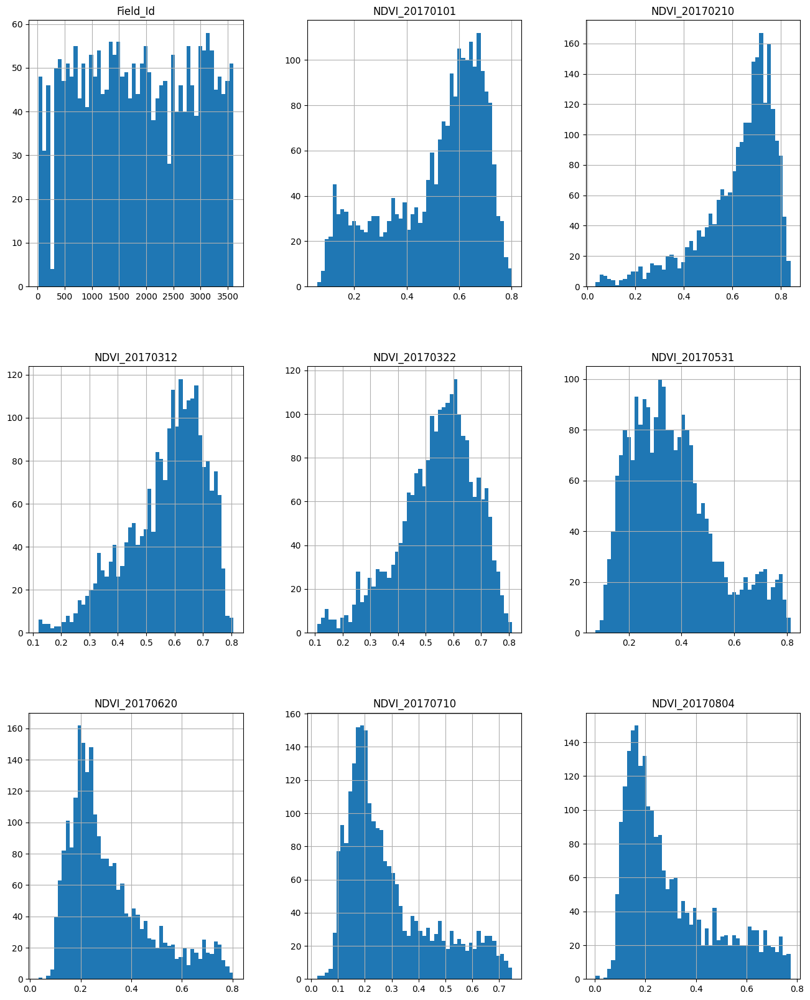

In [ ]:
newdf.hist(figsize=(16, 20), bins=50)

<ipython-input-23-81ba62dff8b4>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_df = df1.groupby('Field_Id').mean().reset_index()


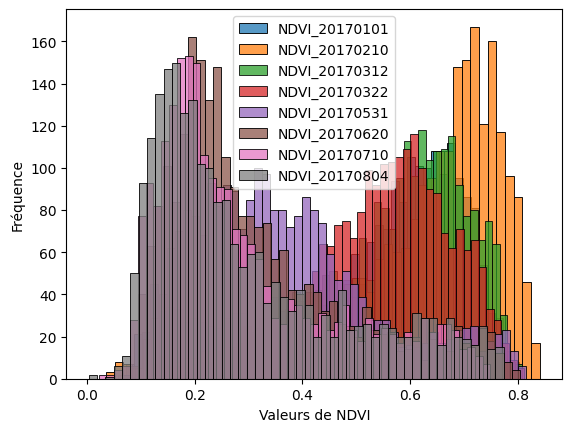

In [ ]:
mean_df = df1.groupby('Field_Id').mean().reset_index()
df_selected = mean_df[['NDVI_20170101','NDVI_20170210', 'NDVI_20170312' , 'NDVI_20170322' , 'NDVI_20170531' , 'NDVI_20170620' , 'NDVI_20170710' , 'NDVI_20170804']]
fig, ax = plt.subplots()
for col in df_selected.columns:
    column_data = df_selected[col]
    sns.histplot(column_data.dropna(), bins=50, label=col, ax=ax)
ax.legend()
plt.xlabel('Valeurs de NDVI')
plt.ylabel('Fréquence')
plt.show()

Les histogrammes des valeurs de NDVI révèlent une distribution similaire pour
différentes dates.
Entre janvier et avril, la distribution est majoritairement concentrée à gauche, avec des valeurs entre 0,45 et 0,1, suggérant une faible densité de végétation.
Entre mai et août, la distribution se déplace vers la droite, avec des valeurs atteignant jusqu'à 0,45, indiquant une augmentation de la densité de la végétation.
Ces variations saisonnières pourraient être liées aux cycles de croissance des cultures ou aux conditions météorologiques.


###Evaluation de NVDI / Parcelles

In [ ]:
def plot_crop(field_id, crop_name):
    df_l = df1[df1['Field_Id'] == field_id]
    df_selected = df_l[['NDVI_20170101','NDVI_20170210', 'NDVI_20170312' , 'NDVI_20170322' , 'NDVI_20170531' , 'NDVI_20170620' , 'NDVI_20170710' , 'NDVI_20170804']]
    fig, ax = plt.subplots()
    for col in df_selected.columns:
        column_data = df_selected[col]
        sns.histplot(column_data.dropna(), bins=8, label=col, ax=ax)
    ax.legend()
    plt.xlabel('Valeurs de NDVI')
    plt.ylabel('Fréquence')
    plt.title(crop_name)  # Use crop_name for the plot title
    plt.show()

**Cotton**


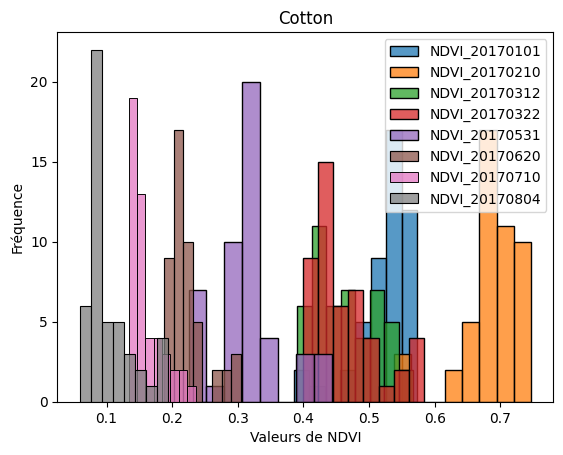

In [ ]:
plot_crop(1750 ,  'Cotton')

Les histogrammes des valeurs de NDVI pour la culture de coton montrent des fluctuations significatives. Initialement élevées, les valeurs chutent aux mois 3 et 4, probablement en raison du blanchissement des graines. Ensuite, une baisse continue est observée jusqu'aux mois 5, 6, 7 et 8.

**Lucern**

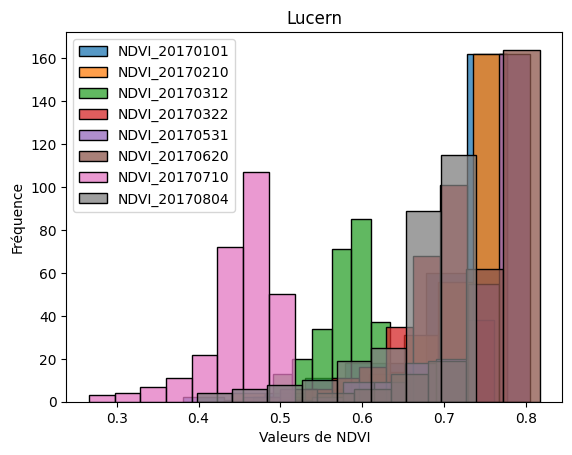

In [ ]:
plot_crop(27 ,  'Lucern')

Les valeurs de NDVI sont principalement concentrées du côté gauche de l'histogramme, ce qui suggère une présence continue de la culture de Lucern tout au long de l'année.

**Vacant**

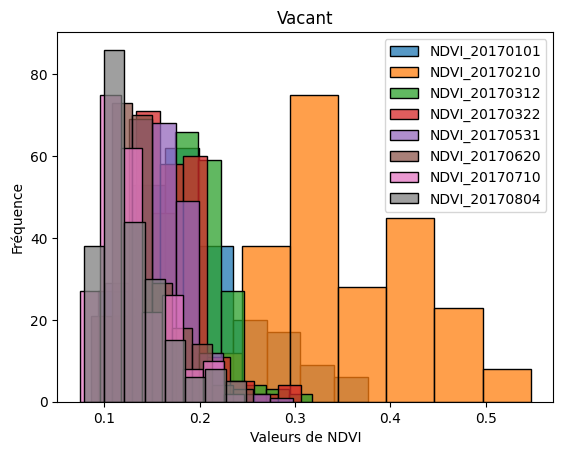

In [ ]:
plot_crop(41 ,  'Vacant')

Les histogrammes présentent des valeurs de NDVI entre 0 et 0,4.

Cette plage de valeurs suggère une faible densité de végétation sur cette parcelle, ce qui est cohérent avec son statut de "vacant", indiquant l'absence de culture active.
Cependant, une légère augmentation des valeurs de NDVI est observable au mois 2, ce qui pourrait être attribué à une croissance végétale temporaire due aux précipitations de ce mois, même en l'absence de culture planifiée.

**Vineyard**

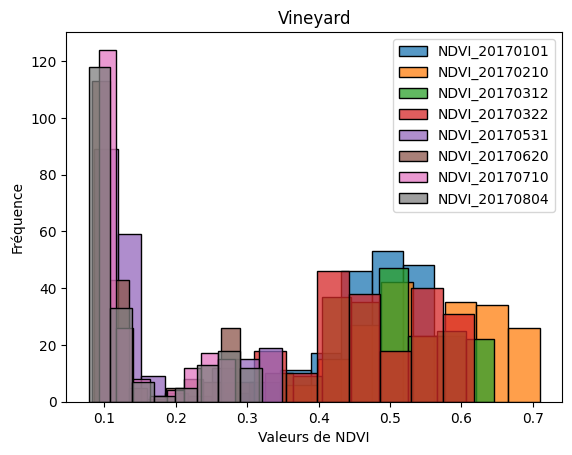

In [ ]:
plot_crop(19 ,  'Vineyard')

Pour les mois de janvier à avril, la distribution des valeurs de NDVI est concentrée dans la région proche de 1, ce qui suggère une densité de végétation élevée et saine pendant cette période.

Pour les mois de mai à août, la distribution des histogrammes est similaire mais centrée autour de valeurs de NDVI comprises entre 0 et 0,3.

### Comparaison entre Pecan,Vineyard,Vineyard & Pecan

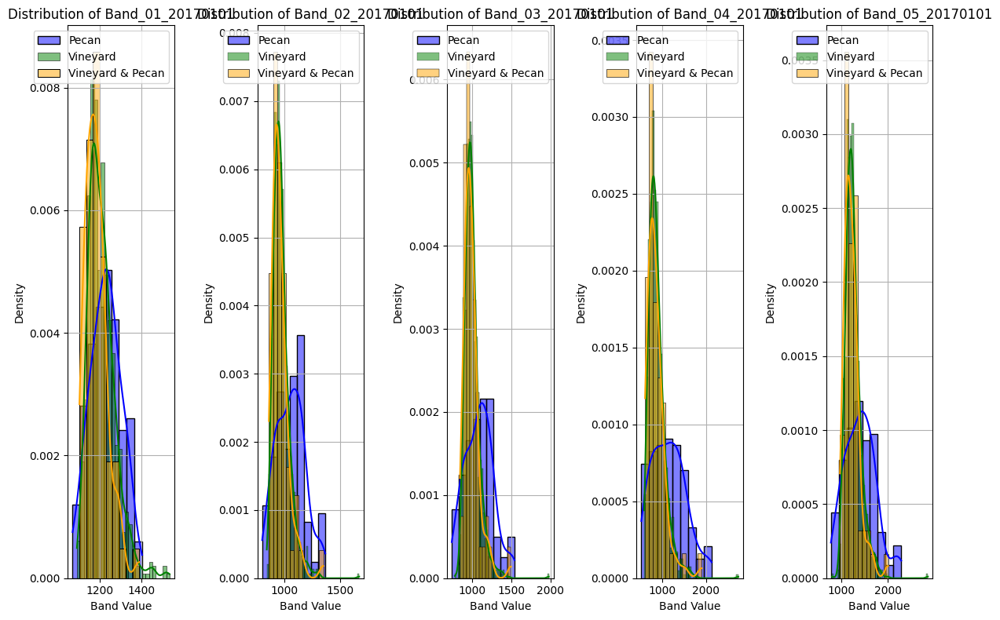

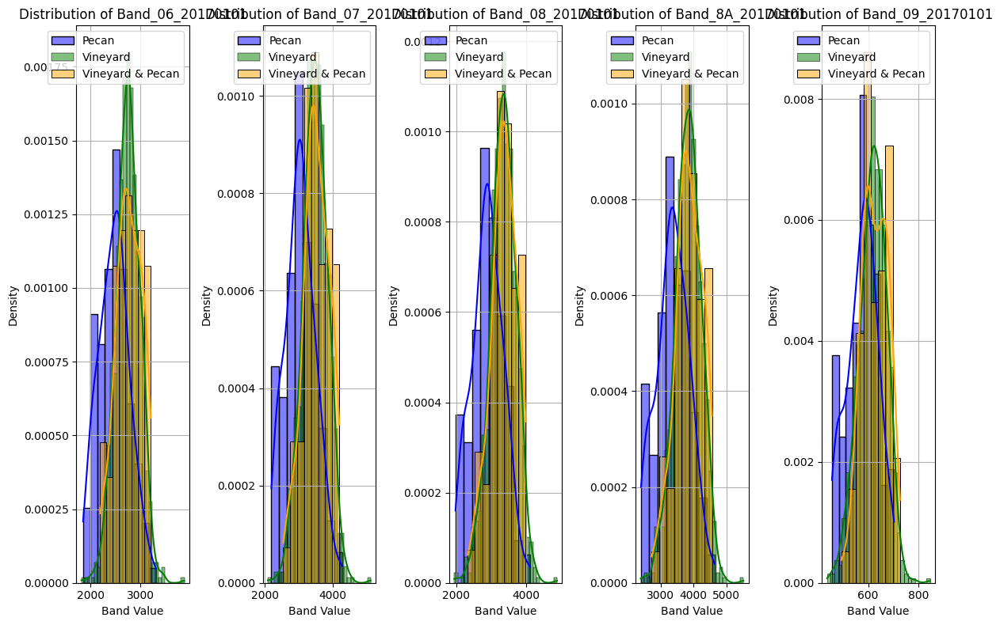

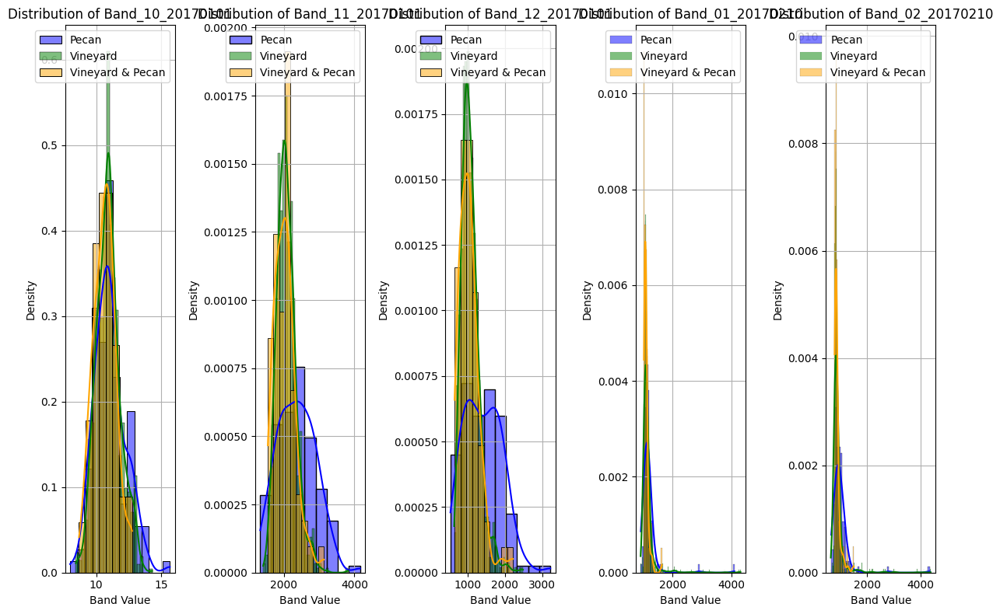

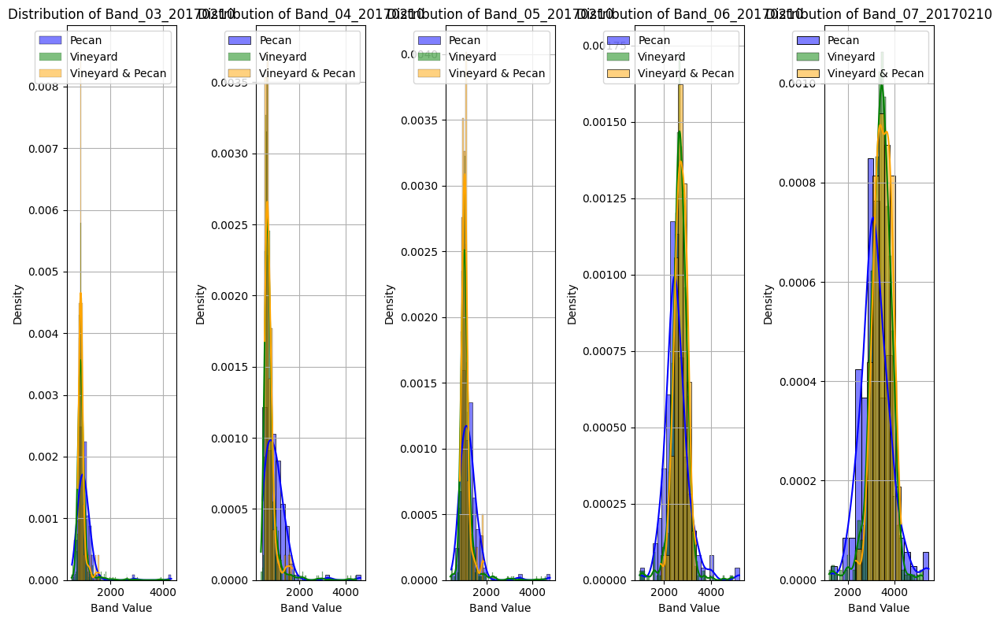

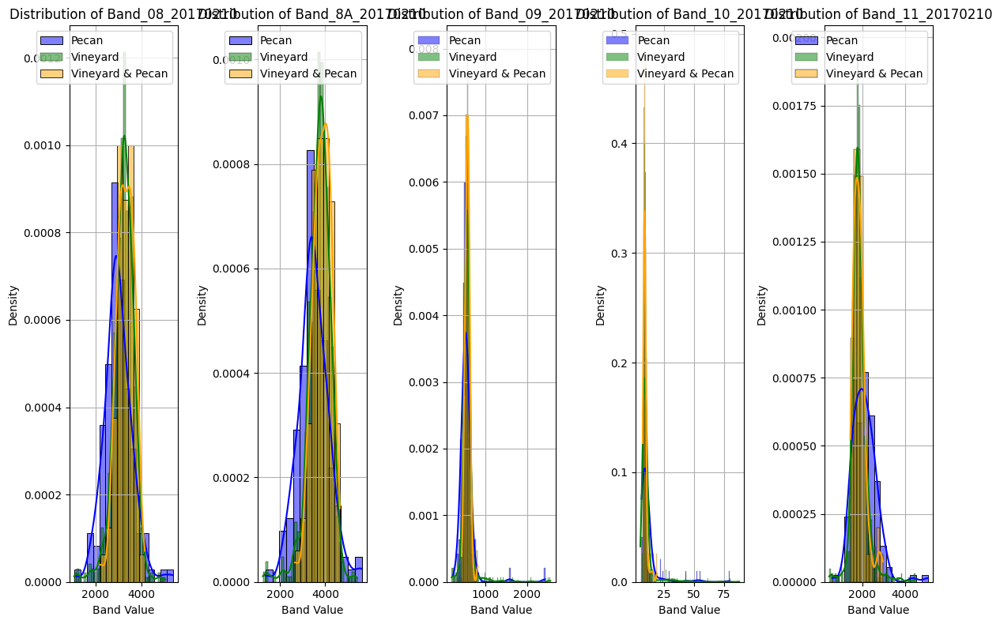

...

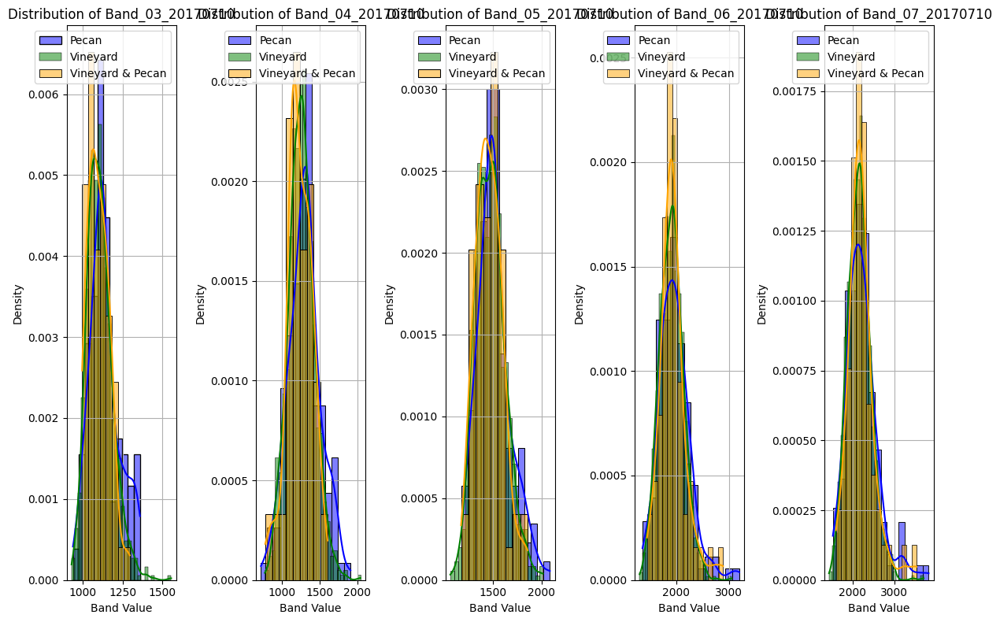

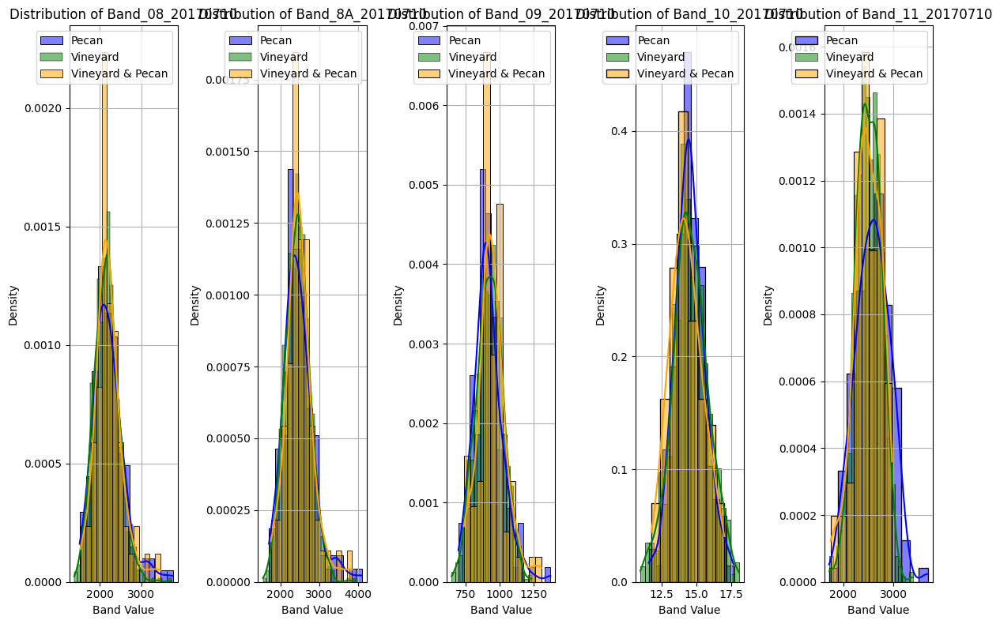

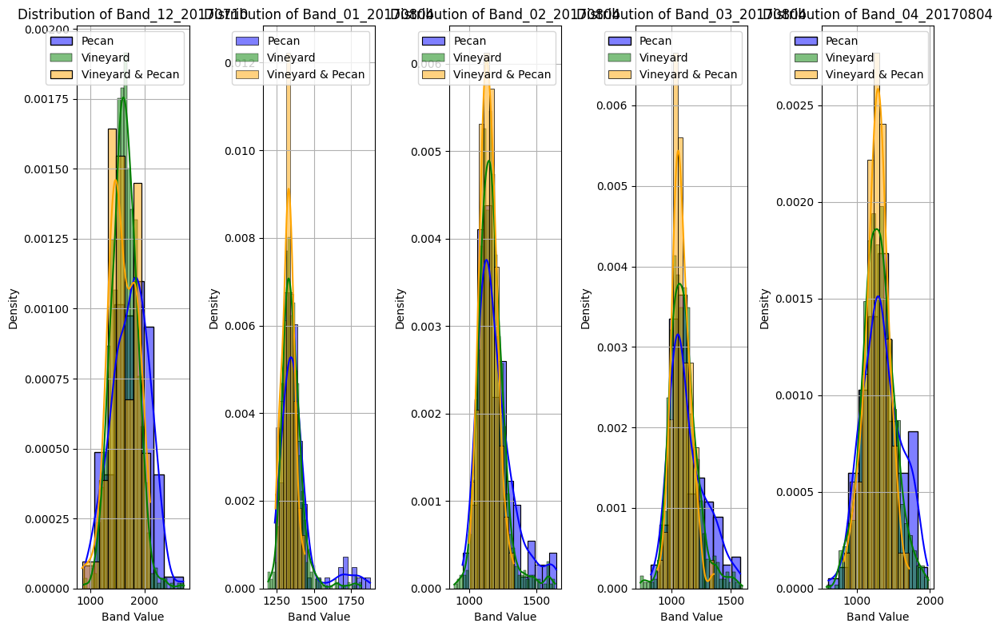

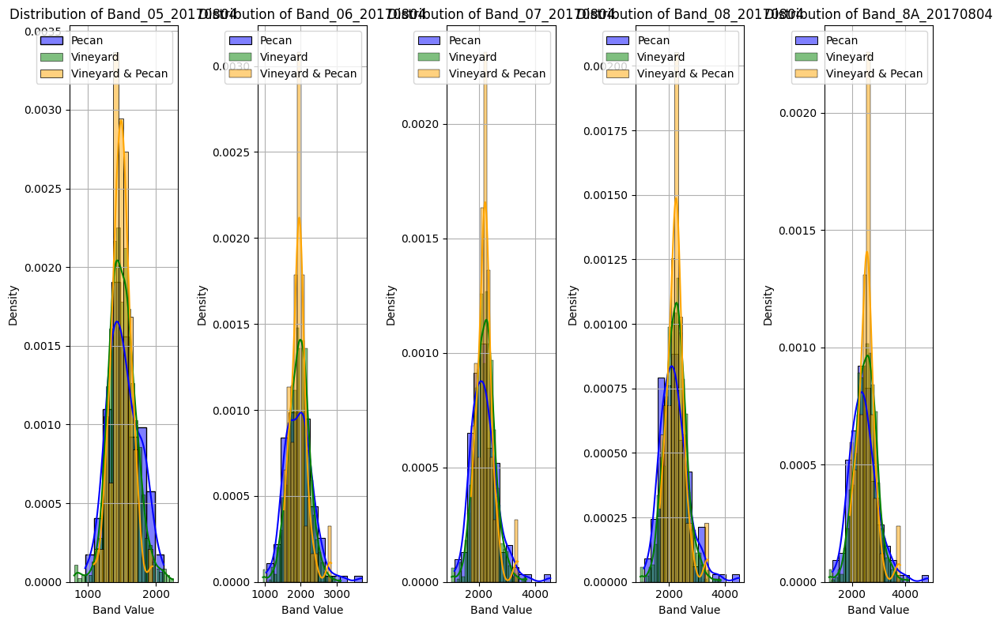

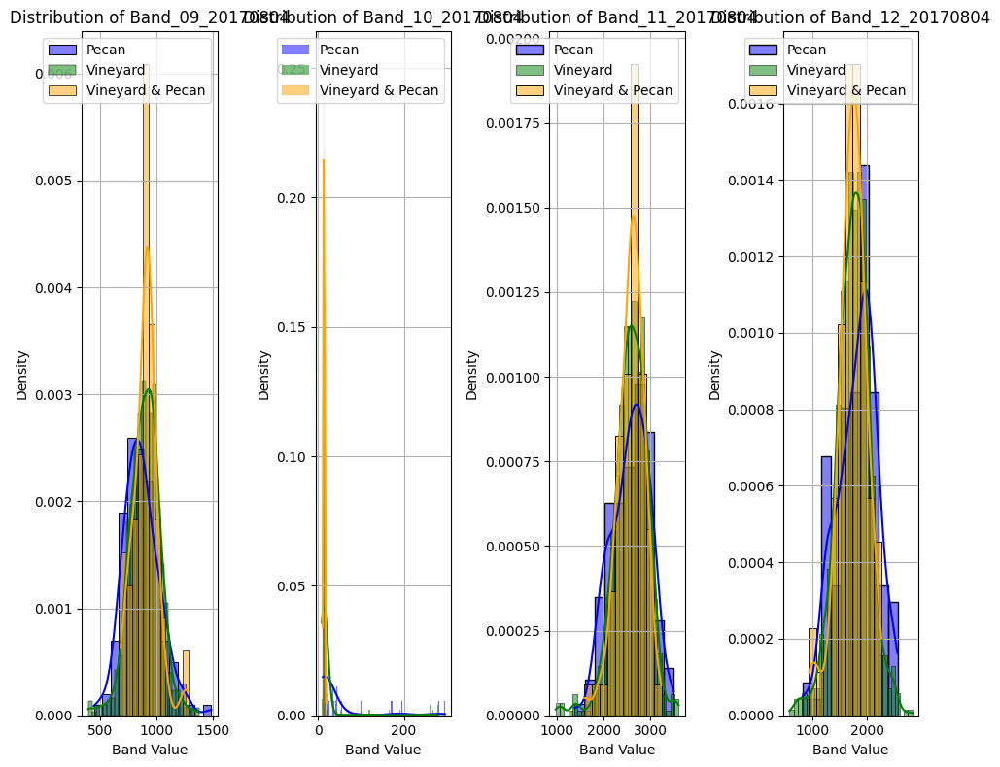

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Mapping des classes
crop_mapping = {
    6: 'Pecan',
    8: 'Vineyard',
    9: 'Vineyard & Pecan ("Intercrop")'
}

# Séparer les données par classe
pecan_data = df[df['Crop_Id_Ne'] == 6]
vineyard_data = df[df['Crop_Id_Ne'] == 8]
intercrop_data = df[df['Crop_Id_Ne'] == 9]

# Liste des colonnes de bande de données
band_columns = [col for col in df.columns if 'Band_' in col]

# Plot pour chaque bande
num_plots = len(band_columns)
num_rows = num_plots // 5 + (num_plots % 5 > 0)

for i in range(num_rows):
    plt.figure(figsize=(12, 8))
    for j in range(5):
        idx = i * 5 + j
        if idx < num_plots:
            plt.subplot(1, 5, j + 1)
            band_column = band_columns[idx]

            # Plot Pecan
            sns.histplot(pecan_data[band_column], kde=True, label='Pecan', color='blue', stat='density')

            # Plot Vineyard
            sns.histplot(vineyard_data[band_column], kde=True, label='Vineyard', color='green', stat='density')

            # Plot Vineyard & Pecan
            sns.histplot(intercrop_data[band_column], kde=True, label='Vineyard & Pecan', color='orange', stat='density')

            plt.title(f'Distribution of {band_column}')
            plt.xlabel('Band Value')
            plt.ylabel('Density')
            plt.legend()
            plt.grid(True)
    plt.tight_layout()
    plt.show()


Les histogrammes des valeurs de chaque bande pour les classes Pecan, Vineyard et Intercrop révèlent une certaine similitude dans la distribution de certaines colonnes.

<ipython-input-15-0110d5865ede>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df1.groupby('Field_Id').mean().reset_index()


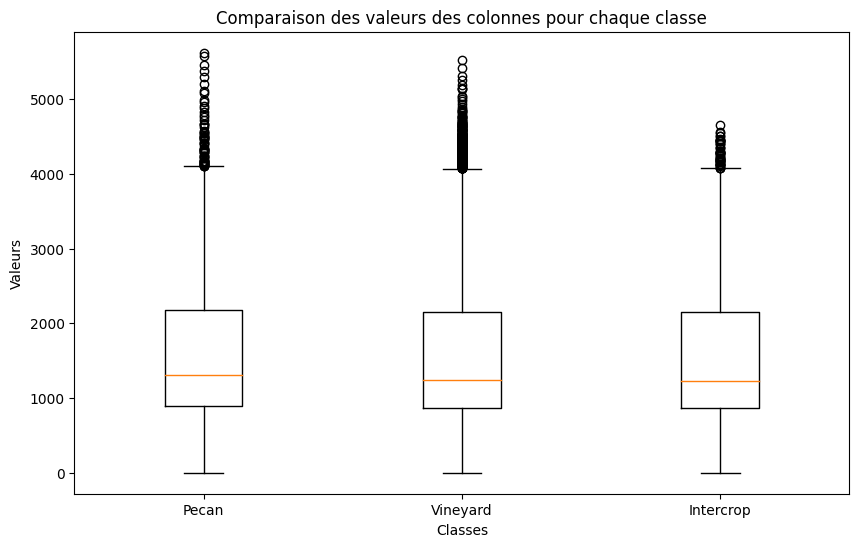

In [ ]:
pecan_columns = df[df['Crop_Id_Ne'] == 6].iloc[:, 3:-1]
vineyard_columns = df[df['Crop_Id_Ne'] == 8].iloc[:, 3:-1]
intercrop_columns = df[df['Crop_Id_Ne'] == 9].iloc[:, 3:-1]
pecan_data = pecan_columns.values.flatten()
vineyard_data = vineyard_columns.values.flatten()
intercrop_data = intercrop_columns.values.flatten()
plt.figure(figsize=(10, 6))
plt.boxplot([pecan_data, vineyard_data, intercrop_data], labels=['Pecan', 'Vineyard', 'Intercrop'])
plt.title('Comparaison des valeurs des colonnes pour chaque classe')
plt.xlabel('Classes')
plt.ylabel('Valeurs')
plt.show()

Les boxplots représentant les valeurs des colonnes pour chaque classe montrent une certaine similarité entre les distributions. Cela suggère que, globalement, les valeurs des colonnes pour les classes Pecan, Vineyard et Intercrop sont comparables.


### Correlation

In [ ]:
correlation_matrix = df1.corr()

<ipython-input-41-6a30502d3456>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df1.corr()


In [ ]:
correlation_matrix

,Pixel_Id,Field_Id,Crop_Id_Ne,Band_01_20170101,Band_02_20170101,Band_03_20170101,Band_04_20170101,Band_05_20170101,Band_06_20170101,Band_07_20170101,...,Band_05_20170804,Band_06_20170804,Band_07_20170804,Band_08_20170804,Band_8A_20170804,Band_09_20170804,Band_10_20170804,Band_11_20170804,Band_12_20170804,NDVI_20170804
Pixel_Id,1.000000,0.999654,0.010184,0.116589,0.089431,0.068911,0.048396,0.037644,-0.043982,-0.043888,...,-0.036650,-0.062213,-0.056485,-0.061242,-0.063144,-0.083268,-0.083900,0.000790,0.044679,-0.039237
Field_Id,0.999654,1.000000,0.009446,0.119144,0.091497,0.070950,0.050105,0.039856,-0.043344,-0.043981,...,-0.037103,-0.060793,-0.055058,-0.059938,-0.061910,-0.081162,-0.082209,-0.001076,0.042310,-0.037413
Crop_Id_Ne,0.010184,0.009446,1.000000,-0.085547,-0.107367,-0.060873,-0.072243,-0.036352,-0.045168,-0.006126,...,0.122429,-0.205641,-0.208394,-0.186150,-0.169868,-0.117686,-0.009747,0.233040,0.179760,-0.184898
Band_01_20170101,0.116589,0.119144,-0.085547,1.000000,0.867008,0.840757,0.820644,0.831801,-0.282360,-0.432940,...,0.178833,-0.056631,-0.081708,-0.087263,-0.107225,-0.115377,0.049655,0.082026,0.176764,-0.175586
Band_02_20170101,0.089431,0.091497,-0.107367,0.867008,1.000000,0.977837,0.959530,0.923013,-0.290195,-0.449282,...,0.195380,-0.080805,-0.107559,-0.113757,-0.131910,-0.121072,0.074825,0.085147,0.187879,-0.223292
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Band_09_20170804,-0.083268,-0.081162,-0.117686,-0.115377,-0.121072,-0.112243,-0.147968,-0.101390,0.361996,0.354008,...,0.270611,0.913144,0.898934,0.879653,0.911431,1.000000,0.259066,0.210339,-0.150444,0.656844
Band_10_20170804,-0.083900,-0.082209,-0.009747,0.049655,0.074825,0.082024,0.158608,0.128098,-0.117197,-0.119803,...,0.403392,0.056165,0.001718,-0.006200,-0.012512,0.259066,1.000000,0.246442,0.285686,-0.213626
Band_11_20170804,0.000790,-0.001076,0.233040,0.082026,0.085147,0.106458,0.111201,0.114452,-0.092898,-0.091552,...,0.898068,0.074820,0.000561,0.027796,0.056105,0.210339,0.246442,1.000000,0.874410,-0.414926
Band_12_20170804,0.044679,0.042310,0.179760,0.176764,0.187879,0.193667,0.226923,0.194310,-0.268027,-0.266756,...,0.771705,-0.282189,-0.352786,-0.336205,-0.322871,-0.150444,0.285686,0.874410,1.000000,-0.699630


In [ ]:
sorted_corr = df1.corr()['Crop_Id_Ne'].sort_values(ascending=False)
sorted_corr_df = pd.DataFrame(sorted_corr)

<ipython-input-54-dfa8b922ffad>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sorted_corr = df1.corr()['Crop_Id_Ne'].sort_values(ascending=False)


In [ ]:
sorted_corr_df.head(20)

,Crop_Id_Ne
Crop_Id_Ne,1.000000
Band_11_20170804,0.233040
Band_11_20170710,0.183929
Band_12_20170804,0.179760
Band_04_20170804,0.165417
Band_12_20170710,0.141528
Band_05_20170804,0.122429
Band_01_20170710,0.111711
Band_02_20170804,0.110531
Band_04_20170710,0.105863


on observe principalement des corrélations relativement faibles. La colonne la plus fortement corrélée avec 'Crop_Id_Ne' présente une corrélation de 0,2.

<ipython-input-18-79e90130de5a>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df1.corr(), annot=True)


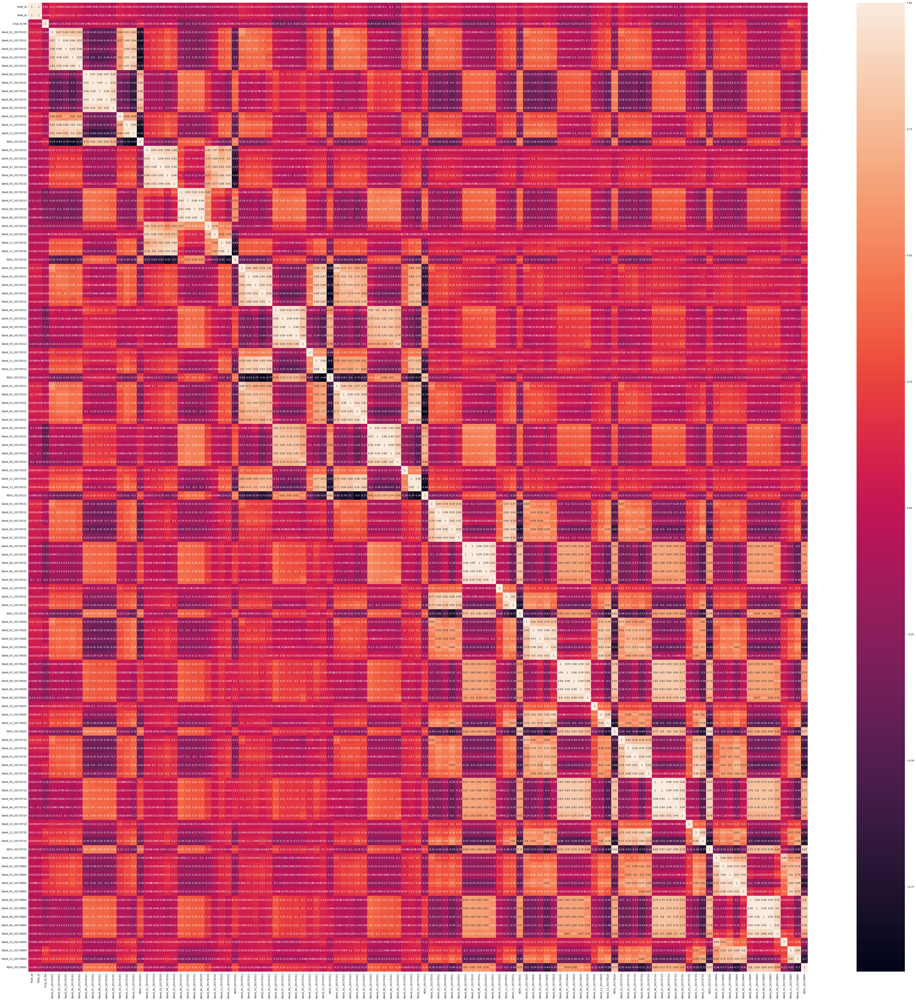

In [ ]:
plt.figure(figsize=(70, 70))
sns.heatmap(df1.corr(), annot=True)
plt.show()